# In this notebook, we compare Time Scale modification methods, primarily Overlap add and Wave Similarity based overlap add. 
## We also compare it with overlap add but without windowing (can be considered a crude compression/strecthing, but better than any cut-and-splice method)

In [1]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.io import wavfile
import librosa
from IPython.display import Audio
import soundfile as sf
#from pydub import AudioSegment
from scipy.signal import spectrogram

The function below is to change the audio files to mono format. These methods for Time scale modification would work for multiple channels as well, however, they would have to be separately applied for both channels. For simplicity, here we've just considered to work on mono audios.

In [2]:
def change_to_mono(file_path,changed_file_path):
    sound = AudioSegment.from_wav("drum.wav")
    sound = sound.set_channels(1)
    sound.export(changed_file_path, format="wav")

In [3]:
#change_to_mono("drum.wav","drum_mono.wav")

### Here, we load different kinds of files to observe the difference in how the Time Scale Modification Methods affect the audio. These are some classical methods that we want to implement, the paper referred to is this: ["A Review of Time-Scale Modification of Music Signals"](https://drive.google.com/file/d/1J0F7Oo7nu5BMb5UGwT1zbGEewxah-V0y/view?usp=sharing). We consider 3 kinds of audio, purely percussive (drums), pitched audios (guitar) and last one being a song clip.

In [4]:
audio1, fs = librosa.load("drum_mono.wav", sr=44100)
audio2, fs = librosa.load("careless_whisper_clip_mono.wav", sr=44100)
audio3, fs = librosa.load("clipped_sandstorm_mono.wav", sr=44100)
#audio3, fs = librosa.load("SingingVoice_ORIG.wav", sr=16000)

Let's hear the original audios. 

In [5]:
#percussive
Audio(data=audio1, rate=fs)

In [9]:
#pitched (guitar)
Audio(data=audio2, rate=fs)

In [10]:
#darude - sandstorm (sorry)
Audio(data=audio3, rate=fs)

### For our processing, let's fix the frame length and hop length. You can always experiment with various lengths, but it's good to make sure they're not too short or too long. There could be some minor perceivable differences with a better choice of these lengths.

In [8]:
frame_length_ms = 50 # in miliseconds
hop_length_ms = 25 #12.5 # in miliseconds

frame_length = int(np.around((frame_length_ms/1000)*fs))# 25ms in samples
hop_size = int(np.around((hop_length_ms/1000)*fs))

# Overlap Add method

<img src="Github/TSM/Overlap_add_principle.jpg" alt="Overlap Add Method description" width="500" height="300">

Based in the figure above, you see Ha (Analysis Hopsize, original hop size) and Hs (Synthesis Hop size). They are related by: $$\alpha = \frac{H_s}{H_a}$$


In [51]:
## OVERLAP ADD
def OLA(data,alpha,windowing_p,frame_length,hop_size):
    """
    This function constructs a frame matrix (shape: frame length in samples , number of frames) after windowing. 
    Changes the hop size according to synthesis requirements (based on alpha and original/analysis hop size), 
    and obtains new frame matrix and reconstructs the signal back.
    """
    #print(type(alpha),type(windowing))
    def windowing(data, frame_length, hop_size):
        data = np.array(data)
        number_of_frames = 1 + int(np.floor((len(data)-frame_length)/hop_size))
        frame_matrix = np.zeros((frame_length,number_of_frames))
        window = np.hanning(frame_length)
        for i in range(number_of_frames):
            frame = np.zeros(frame_length) # Initialize frame as zeroes
            start = i*hop_size
            stop = np.minimum(start+frame_length,len(data))
            frame[0:stop-start] = data[start:stop]
            if windowing_p==1: #when 1, windowed else not windowed
                frame_matrix[:,i] = np.multiply(window,frame) 
            else:
                frame_matrix[:,i] = frame
                
        return frame_matrix

    alpha = alpha# alpha greater than 1 slows it down
    hop_size_synth = int(alpha * hop_size)
    #print(hop_size_synth, hop_size)
    modified_frame_matrix = windowing(data, frame_length, hop_size_synth)# Windowing
    frame_matrix = windowing(data, frame_length, hop_size)
    def reconstruct_signal(frame_matrix, hop_size):
        """
        Reconstructs the signal from the frame matrix.
        """
        frame_length, number_of_frames = frame_matrix.shape
        output_signal_length = hop_size * (number_of_frames - 1) + frame_length
        output_signal = np.zeros(output_signal_length)

        for i in range(number_of_frames):
            start = i * hop_size
            stop = start + frame_length
            output_signal[start:stop] += frame_matrix[:, i]

        return output_signal

    # Reconstruct the signal from the frame matrix
    reconstructed_signal = reconstruct_signal(frame_matrix, hop_size_synth)

    # Normalize the reconstructed signal to prevent potential clipping
    reconstructed_signal = librosa.util.normalize(reconstructed_signal)
    return reconstructed_signal
    # Save the reconstructed signal to an audio file
    #sf.write('reconstructed_drum.wav', reconstructed_signal, fs)

In [52]:
# OLA on audio 3 -- sand OLA fast 1.5, slow 0.5
sand_ola_slow=OLA(audio3,1.5,1,frame_length,hop_size)
sand_ola_fast=OLA(audio3,0.5,1,frame_length,hop_size)
sand_fast = OLA(audio3,0.5,0,frame_length,hop_size)

In [43]:
#Slowed
aud_sand_slowed = Audio(data=sand_ola_slow, rate=fs)
display(aud_sand_slowed)

# Fast
aud_sand_fast = Audio(data=sand_ola_fast, rate=fs)
display(aud_sand_fast)

### let's do the same for the percussive audio but also compare it with basic compression/stretching (OLA without windowing, let's call it OLA-NW for ease of reference)

In [44]:
drum_ola_slow=OLA(audio1,1.5,1,frame_length,hop_size)
drum_ola_fast=OLA(audio1,0.5,1,frame_length,hop_size)
drum_fast_ola_nw=OLA(audio1,0.5,0,frame_length,hop_size)
drum_slow_ola_nw=OLA(audio1,1.5,0,frame_length,hop_size)

#### Comparison of OLA and OLA-NW for percussive sound -- Slow and fast

In [45]:
aud_drum_ola_slow = Audio(data=drum_ola_slow, rate=fs)
display(aud_drum_ola_slow)

aud_drum_ola_nw_slow = Audio(data=drum_slow_ola_nw, rate=fs)
display(aud_drum_ola_nw_slow)

In [46]:
aud_drum_ola_fast = Audio(data=drum_ola_fast, rate=fs)
display(aud_drum_ola_fast)

aud_drum_fast_ola_nw = Audio(data=drum_fast_ola_nw, rate=fs)
display(aud_drum_fast_ola_nw)

If you heard the audios, you may have noticed that the OLA method with windowing is less noisy/ has less jitter than the other method. We can also try to hear the effects on pictched sounds like guitar.

In [47]:
guitar_ola_slow=OLA(audio2,1.5,1,frame_length,hop_size)
guitar_ola_fast=OLA(audio2,0.5,1,frame_length,hop_size)
guitar_fast_ola_nw=OLA(audio2,0.5,0,frame_length,hop_size)
guitar_slow_ola_nw=OLA(audio2,1.5,0,frame_length,hop_size)

In [48]:
# SLOWED-- guitar
aud_guitar_ola_slow = Audio(data=guitar_ola_slow, rate=fs)
display(aud_guitar_ola_slow)

aud_guitar_slow_ola_nw = Audio(data=guitar_slow_ola_nw, rate=fs)
display(aud_guitar_ola_slow)

In [49]:
# FAST
aud_guitar_ola_fast = Audio(data=guitar_ola_fast, rate=fs)
display(aud_guitar_ola_fast)

aud_guitar_fast_ola_nw = Audio(data=guitar_fast_ola_nw, rate=fs)
display(aud_guitar_fast_ola_nw)

In [31]:
drum_ola_w = OLA(audio1,0.5,1,frame_length,hop_size)
drum_ola = OLA(audio1,0.5,0,frame_length,hop_size)
drum_ola_w_slow = OLA(audio1,1.5,1,frame_length,hop_size)
drum_ola_slow = OLA(audio1,1.5,0,frame_length,hop_size)
#guitar_ola_w_slow = OLA(aud_g,1.5,1,frame_length,hop_size)
#guitar_ola_slow = OLA(aud_g,1.5,0,frame_length,hop_size)

In [32]:
guitar_ola_f = OLA(audio2,0.25,1,frame_length,hop_size)
guitar_f = OLA(audio2,0.25,0,frame_length,hop_size)
#drum_ola_w_slow = OLA(audio1,1.5,1,frame_length,hop_size)
#drum_ola_slow = OLA(audio1,1.5,0,frame_length,hop_size)

In [181]:
# write out the outputs
#sf.write('drum_ola_fast.wav', drum_ola_w, fs)
#sf.write('drum_fast.wav', drum_ola, fs)
#sf.write('drum_ola_slow.wav', drum_ola_w_slow, fs)
#sf.write('drum_slow.wav', drum_ola_slow, fs)
#sf.write('guitar_ola_fast.wav', guitar_ola_w, fs)
#sf.write('guitar_fast.wav', guitar_ola, fs)
#sf.write('guitar_ola_slow.wav', guitar_ola_w_slow, fs)
#sf.write('guitar_slow.wav', guitar_ola_slow, fs)

# Waveform Similarity Overlap-Add method

<img src="Github/TSM/WSOLA_principle.jpg" alt="Overlap Add Method description" width="500" height="300">

In [33]:
import numpy as np

def cross_correlation(x, y):
    """Calculate the cross-correlation of two signals."""
    if len(x) < len(y):
        x, y = y, x  # x should be the longer signal
    correlation = np.correlate(x, y, mode='full')
    return correlation[len(x)-1:]

def wsola(signal, frame_length, hop_size_analysis, hop_size_synth, delta_max):
    number_of_frames = 1 + int(np.floor((len(signal) - frame_length) / hop_size_analysis))
    output_length = hop_size_synth * (number_of_frames - 1) + frame_length
    output_signal = np.zeros(output_length)
    window = np.hanning(frame_length)

    frame_start = 0
    for i in range(number_of_frames):
        analysis_start = frame_start + hop_size_analysis
        if analysis_start + frame_length > len(signal):
            break  # Avoid reading beyond the end of the data

        # Window the analysis frame
        analysis_frame = signal[analysis_start:analysis_start+frame_length] * window
        
        # Define search region for the next frame
        search_start = max(0, analysis_start - delta_max)
        search_end = min(len(signal), analysis_start + delta_max)
        search_region = signal[search_start:search_end]
        #print(analysis_frame)
        # Find the best match in the search region
        correlation = cross_correlation(search_region, analysis_frame)
        best_match_index = np.argmax(correlation)
        delta = best_match_index #- delta_max
        
        # Overlap and add the synthesis frame to the output signal
        synthesis_start = i * hop_size_synth
        output_signal[synthesis_start:synthesis_start+frame_length] += analysis_frame

        # Adjust frame start for the next iteration
        frame_start += hop_size_analysis + delta

    # Normalize the output signal
    output_signal /= np.max(np.abs(output_signal))

    return output_signal


#processed_signal3 = wsola(audio3, frame_length, hop_size_analysis, hop_size_synth, delta)


In [36]:
hop_size_analysis = int(np.around((hop_length_ms/1000)*fs))# 12.5 ms (25/2 ms) in samples (50% overlap)

alpha=0.5
delta = int(0.05 * hop_size_analysis)#20#int(0.25 * hop_size_analysis) #how many samples? one frame has approx 80 samples, considering 16k sr
hop_size_synth = int(alpha * hop_size_analysis) + delta

wsola_guitar = wsola(audio2, frame_length, hop_size_analysis, hop_size_synth, delta)

## Visualise the differences through spectrogram comparison between OLA, ONA-NW and WSOLA

In [37]:
def plot_spectrogram(signal, title):
    plt.figure(figsize=(10, 4))
    spectrogram = librosa.feature.melspectrogram(y=signal, sr=fs)
    librosa.display.specshow(librosa.power_to_db(spectrogram, ref=np.max), sr=fs, hop_length=hop_size, x_axis='time', y_axis='mel')
    plt.colorbar(format='%+2.0f dB')
    plt.title(title)
    plt.show()

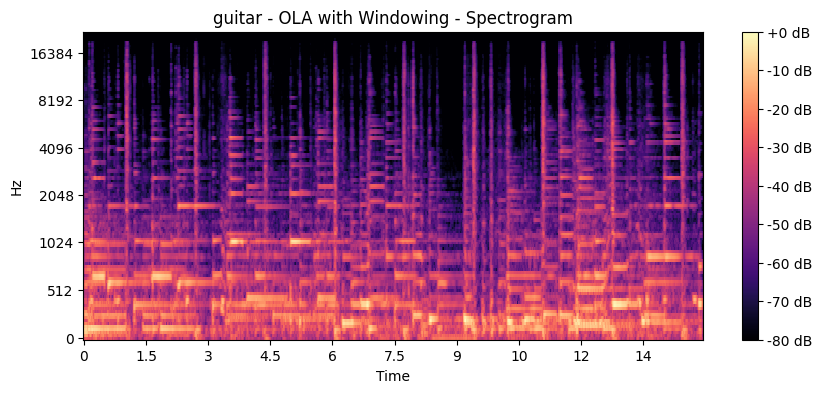

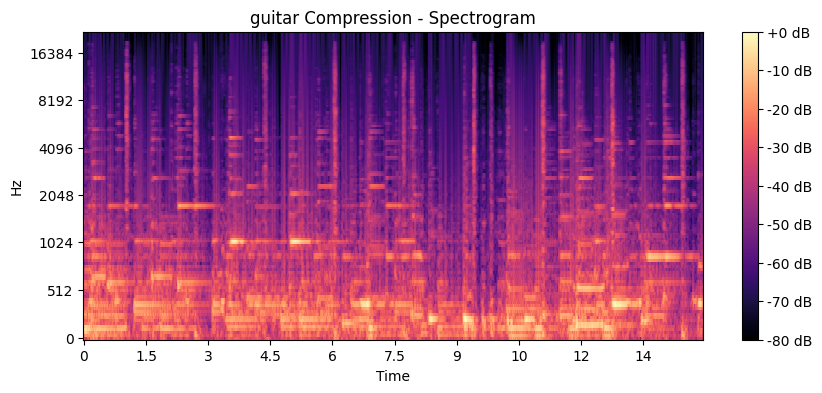

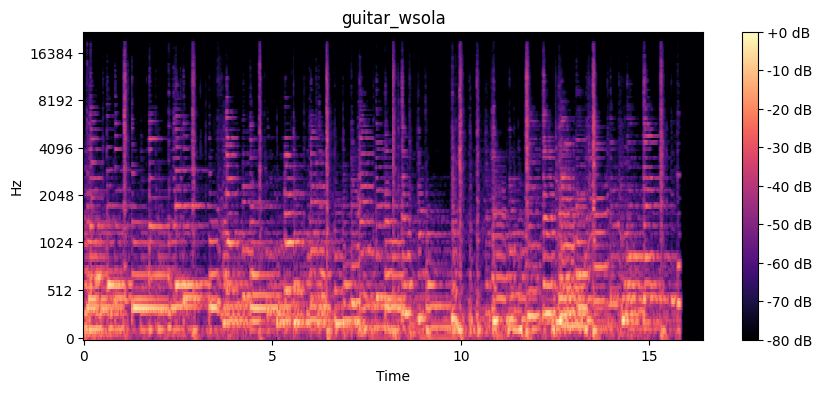

In [62]:
plot_spectrogram(guitar_ola_w, 'guitar - OLA with Windowing - Spectrogram')

# Plot Compression spectrogram
plot_spectrogram(guitar_ola, 'guitar Compression - Spectrogram')
plot_spectrogram(wsola_guitar, 'guitar_wsola')


In [40]:
sand_wsola_fast = wsola(audio3, frame_length, hop_size_analysis, hop_size_synth, delta)

## Differences are better observed in the spectrogram, partcularly in the form of better resolution. The frequencies are smeared in the middle which is OLA-NW, then it improves slightly with OLA (top) and lastly, the relatively best performing method, WSOLA. 
## It would also be interesting to see how these methods impact the waveforms for a given segment. Below, although there is not a lot that can be concluded but it's worth noting that the waveforms are less jittery as the mothods improve

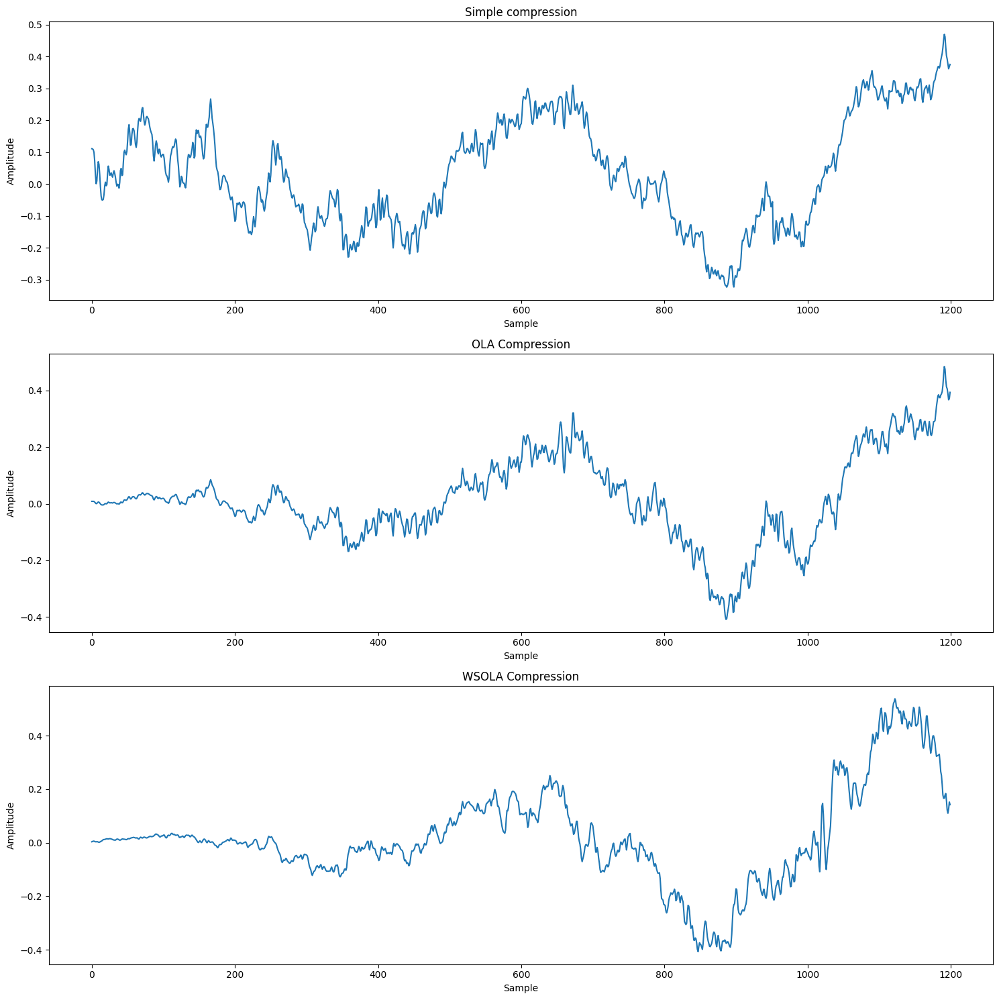

In [54]:
 
# Plot OLA with windowing waveform
some_length = 150
plt.figure(figsize=(15, 15))

plt.subplot(3, 1, 1)  # 3 rows, 1 column, position 3
#plt.plot(sand_fast[3*some_length:5*some_length])
plt.plot(sand_fast[some_length:9*some_length])
plt.title('Simple compression')
plt.xlabel('Sample')
plt.ylabel('Amplitude')

plt.subplot(3, 1, 2)  # 3 rows, 1 column, position 1
plt.plot(sand_ola_fast[some_length:9*some_length])
#plt.plot(sand_ola_slow[-20*some_length:-1])
plt.title('OLA Compression')
plt.xlabel('Sample')
plt.ylabel('Amplitude')

# Plot Compression waveform (1st plot of 3)
plt.subplot(3, 1, 3)  # 3 rows, 1 column, position 2
plt.plot(sand_wsola_fast[some_length:9*some_length])
plt.title('WSOLA Compression')
plt.xlabel('Sample')
plt.ylabel('Amplitude')

plt.tight_layout()  # Adjust layout to prevent overlap
plt.show()
